In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2), 10),
                         n_sources=200, verbose=True, sourceFluxRange=(2000., 120000.), 
                         psf_yvary_factor=0., psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: 0.0 0.0
Variable source: 5 429.930150068 45.4111877538 0 876.812408671
Variable source: 7 47.0281372458 83.6987374825 0 876.812408671
Variable source: 11 41.0344890951 414.019055818 0 876.812408671
Variable source: 3 131.083544347 80.5203306927 0 876.812408671
Variable source: 2 177.353565847 137.867862426 0 876.812408671
Variable source: 6 199.495824513 374.913115553 0 876.812408671
Variable source: 0 163.630302512 214.310623839 0 876.812408671
Variable source: 9 261.15293133 158.934365254 0 876.812408671
Variable source: 4 313.612190791 285.197720876 0 876.812408671
Variable source: 1 280.641774149 295.906549472 0 876.812408671
{'Zogy': {'FP': 2, 'FN': 5, 'TP': 5}, 'ALstack': {'FP': 5, 'FN': 4, 'TP': 6}, 'SZogy': {'FP': 0, 'FN': 10, 'TP': 0}, 'ALstack_decorr': {'FP': 2, 'FN': 6, 'TP': 4}}


A&L(dec): stats(mean=0.056409959, stdev=24.17757, min=-135.2399, max=186.8837)
Zogy: stats(mean=0.018241414849035673, stdev=24.263403759272784, min=-160.35538215010945, max=156.86833529398118)
A&L(dec) - Zogy: stats(mean=0.025465714758368847, stdev=1.7787451167184696, min=-35.284493339510632, max=121.13578910201375)
A&L(dec) - A&L: stats(mean=-0.021872632, stdev=6.7160521, min=-37.531403, max=51.202789)


diffimTests/diffimTests.py:104: RuntimeWarning: invalid value encountered in greater
  imagesToPlot.append((self.S_Zogy.im / self.S_Zogy.var > 5.) * 10.0)


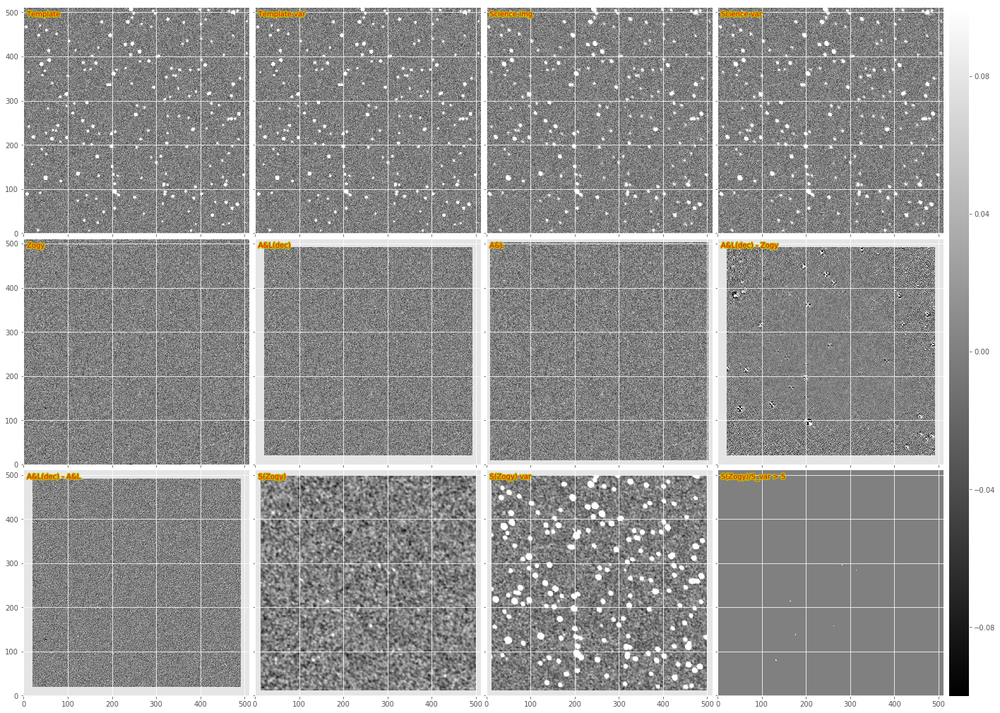

In [3]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6, include_Szogy=True);

In [4]:
print dit.computeClippedImageStats(testObj.S_Zogy.im)
print dit.computeClippedImageStats(testObj.S_Zogy.var)
print dit.computeClippedImageStats(testObj.S_Zogy.im / testObj.S_Zogy.var)

stats(mean=0.0025505250345399214, stdev=0.15112390810275378, min=-0.61320814066903939, max=0.95891197086361268)
stats(mean=0.15258449506188609, stdev=0.00068424191971917336, min=0.14933816216108073, max=0.86989031653971094)
stats(mean=0.014433590192175796, stdev=0.98170417834663548, min=-3.9984692373690014, max=6.1185193049026321)


/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':


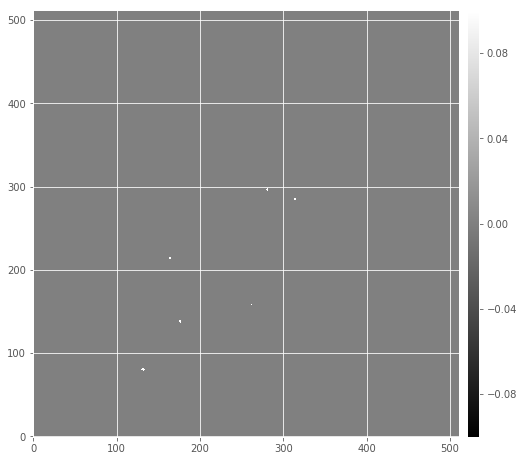

In [6]:
dit.plotImageGrid(((testObj.S_Zogy.im / testObj.S_Zogy.var > 5.) * 10.0,), imScale=8)

In [9]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

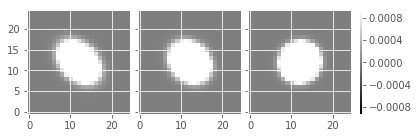

In [5]:
dit.plotImageGrid((testObj.variablePsf.getImage(20., 20.), 
                   testObj.variablePsf.getImage(250., 250.),
                   testObj.variablePsf.getImage(500., 500.)))

OK, let's try a spatially-varying ZOGY! But without correctly setting the (spatially varying) PSF of the diffim.

In [6]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        inImageSpace = kwargs.get('inImageSpace', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this really helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        D_zogy, var_zogy = None, None
        if not inImageSpace:
            padSize0 = subarr1.shape[0]//2 - psf1.shape[0]//2
            padSize1 = subarr1.shape[1]//2 - psf1.shape[1]//2
            # Hastily assume the image is even-sized and the psf is odd... and that the two images
            #   and psfs have the same dimensions!
            psf1 = np.pad(psf1b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            psf2 = np.pad(psf2b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            if psf1.shape[0] > subarr1.shape[0]:
                psf1 = psf1[:-1, :]
                psf2 = psf2[:-1, :]
            elif psf1.shape[0] < subarr1.shape[0]:
                psf1 = np.pad(psf1, ((0, 1), (0, 0)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 1), (0, 0)), mode='constant', constant_values=0)
            if psf1.shape[1] > subarr1.shape[1]:
                psf1 = psf1[:, :-1]
                psf2 = psf2[:, :-1]
            elif psf1.shape[1] < subarr1.shape[1]:
                psf1 = np.pad(psf1, ((0, 0), (0, 1)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 0), (0, 1)), mode='constant', constant_values=0)
            #psf1 = dit.psf.recenterPsf(psf1)
            #psf2 = dit.psf.recenterPsf(psf2)
            psf1 /= psf1.sum()
            psf2 /= psf2.sum()

            #shape2 = dit.arrayToAfwPsf(psf2).computeShape(afwGeom.Point2D(center[0], center[1]))
            #shape1 = dit.arrayToAfwPsf(psf1).computeShape(afwGeom.Point2D(center[0], center[1]))
            #print center, shape2, shape1

            D_zogy, var_zogy = dit.zogy.performZogy(subarr1, subarr2,
                                                subvar1, subvar2,
                                                psf1, psf2, 
                                                sig1=sig1, sig2=sig2)
        else:
            D_zogy, var_zogy = dit.zogy.performZogyImageSpace(subarr1, subarr2,
                                                           subvar1, subvar2,
                                                           psf1, psf2, 
                                                           sig1=sig1, sig2=sig2, padSize=7)
            #print 'HERE:', subExp.getBBox(), np.sum(~np.isnan(D_zogy)), np.sum(~np.isnan(var_zogy))

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()
        tmpIM.getImage().getArray()[:, :] = D_zogy
        tmpIM.getVariance().getArray()[:, :] = var_zogy
        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        #print template
        #img += 10.
        #return out #, psf1_orig, psf2_orig
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

In [7]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [8]:
newExp = task.run(exposure, template=template).exposure #, variablePsf=testObj.variablePsf)

In [9]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, sigmas=[sig1, sig2]).exposure

17.3359 17.3484


In [10]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [11]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()

stats(mean=0.96558559, stdev=17.685284, min=-74.0, max=4097.0)
stats(mean=-0.00045274608, stdev=24.391314, min=-602.29358, max=1095.7758)
stats(mean=-0.00073856482, stdev=24.391706, min=-602.15436, max=1095.562)
stats(mean=0.0081893886, stdev=24.382486, min=-535.84265, max=392.53876)
stats(mean=0.44725776, stdev=8.6151962, min=-40.769287, max=3179.9373)
stats(mean=-2.5491857191262766e-06, stdev=0.0051755104787823344, min=-370.04531142724073, max=108.60656158278142)
stats(mean=4.9324866050124839e-08, stdev=4.2658599727978742e-05, min=-369.94997451317823, max=108.60667220900213)
stats(mean=3.2204921838658988e-05, stdev=0.0017040691407238058, min=-0.016441274198025324, max=0.040904280929225934)


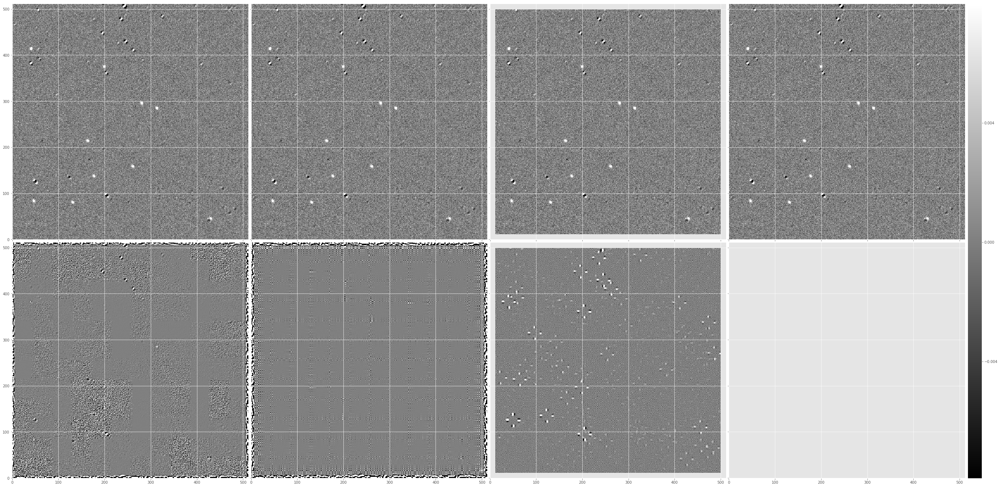

In [13]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im,
                  ga(newExpA)-testObj.D_Zogy.im, ga(newExpB)-testObj.D_Zogy.im), imScale=12)

Looks good, let's see what's going on on the edges...

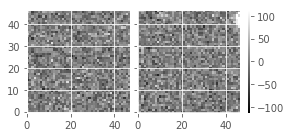

In [14]:
subexps = task._runMapper(exposure, template=template, sigmas=[sig1, sig2])
dit.plotImageGrid((subexps[0].subExposure, subexps[1].subExposure))

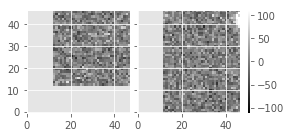

In [15]:
subexps = task._runMapper(exposure, template=template, sigmas=[sig1, sig2], inImageSpace=True)
dit.plotImageGrid((subexps[0].subExposure, subexps[1].subExposure))

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


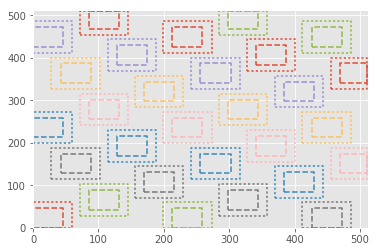

In [16]:
print task.config
task._plotBoxes(exposure.getBBox(), skip=5)

### try with *input* but variable psf.

In [17]:
newExp = task.run(exposure, template=template, variablePsf=testObj.variablePsf).exposure

stats(mean=0.96558559, stdev=17.685284, min=-74.0, max=4097.0)
stats(mean=0.021157876, stdev=24.289349, min=-376.32401, max=281.40808)
stats(mean=0.46019641, stdev=8.7687798, min=-38.931969, max=4152.5532)
stats(mean=-0.0084884544264750145, stdev=1.1887588794969992, min=-1064.305429723697, max=504.02363907051961)


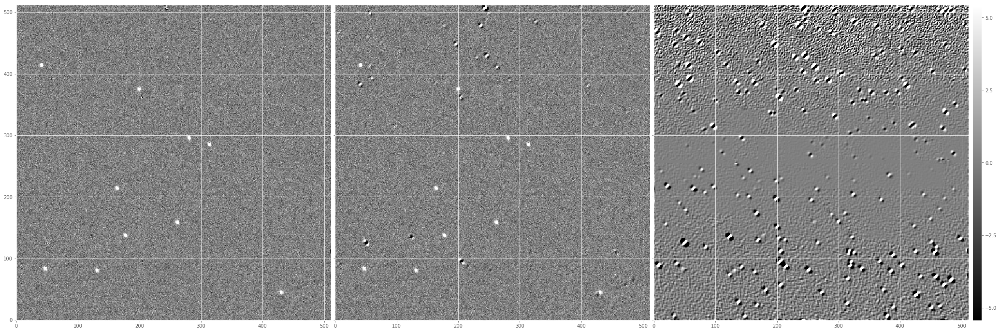

In [18]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im), imScale=12)

In [19]:
newExpB = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf).exposure

stats(mean=0.96558559, stdev=17.685284, min=-74.0, max=4097.0)
stats(mean=0.03067204, stdev=24.290228, min=-155.29362, max=281.40823)
stats(mean=0.4480935, stdev=8.7568979, min=-38.932022, max=2772.6189)
stats(mean=-0.008182461147435819, stdev=1.1337700976915828, min=-342.96724781183752, max=407.28786389899102)
stats(mean=2.092328e-05, stdev=0.003304221, min=-0.19400355, max=0.79143977)


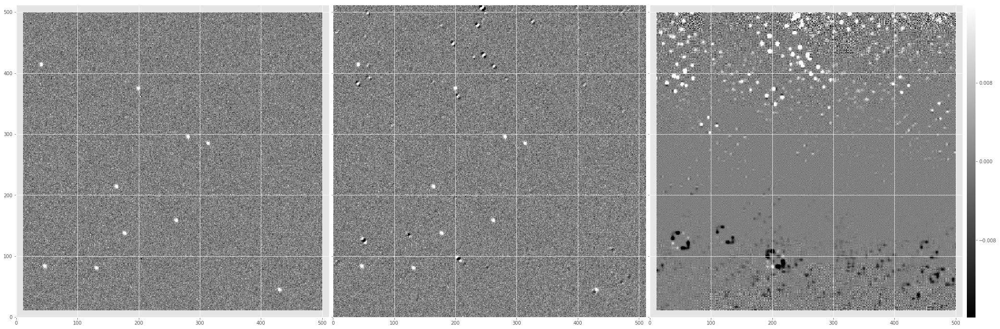

In [20]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExpB))
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - ga(newExp))
dit.plotImageGrid((ga(newExpB), testObj.D_Zogy.im, ga(newExpB)-ga(newExp)), imScale=12)

### re-do with measured psfs...

13


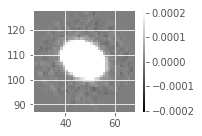

In [21]:
import lsst.meas.extensions.psfex as psfex

# copied ~/lsstsw/build/meas_extensions_psfex/tests/testPsfexPsf.py to ./testPsfexPsfEDITED.py
# then made some edits...
import testPsfexPsfEDITED as tpp
reload(tpp)
obj1 = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj1.makeExposure()
obj1.setUp()
obj1.testPsfexDeterminer()
dit.plotImageGrid((obj1.exposure.getPsf(),))

In [22]:
reload(tpp)
obj2 = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj2.setExposure(exposure)
obj2.setUp()
obj2.testPsfexDeterminer()

188


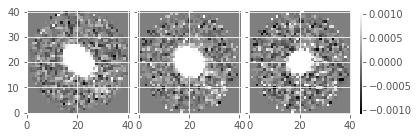

In [23]:
#dit.plotImageGrid((obj.exposure.getPsf(),))
psf = obj2.exposure.getPsf()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

Psfs from my images are definitely more noisy than the fake image in the Psfex test. Let's figure out whats going on in the images themselves.

In [24]:
mi1 = obj1.exposure.getMaskedImage()
mi2 = obj2.exposure.getMaskedImage()

print dit.computeClippedImageStats(mi1.getImage().getArray())
print dit.computeClippedImageStats(mi2.getImage().getArray())
print()
print dit.computeClippedImageStats(mi1.getVariance().getArray())
print dit.computeClippedImageStats(mi2.getVariance().getArray())

stats(mean=0.20954028, stdev=3.0907314, min=-12.13588, max=3484.6636)
stats(mean=0.96558559, stdev=17.685284, min=-74.0, max=4097.0)
()
stats(mean=32.867466, stdev=163.26508, min=9.0, max=3505.3325)
stats(mean=300.96561, stdev=17.685284, min=226.0, max=4397.0)


/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:94: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:116: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


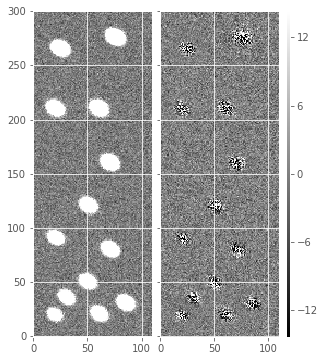

In [25]:
dit.plotImageGrid((obj1.exposure, obj1.subtracted), imScale=6)

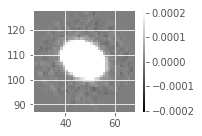

In [26]:
psf = obj1.exposure.getPsf()
dit.plotImageGrid((psf,))

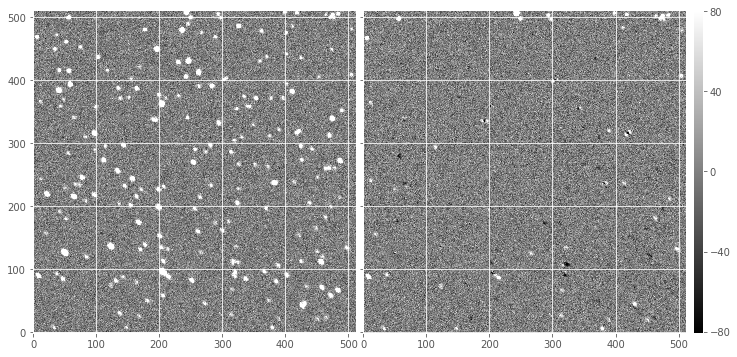

In [27]:
dit.plotImageGrid((obj2.exposure, obj2.subtracted), imScale=6)

Now run the test Psfex determiner on my images!

In [28]:
exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(template2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

188
193


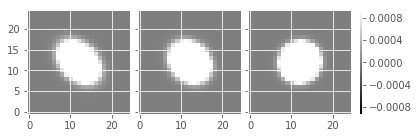

In [29]:
dit.plotImageGrid((testObj.variablePsf.getImage(40., 40.), 
                   testObj.variablePsf.getImage(250., 250.),
                   testObj.variablePsf.getImage(500., 500.)))

(41, 41)


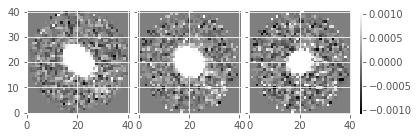

In [30]:
psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

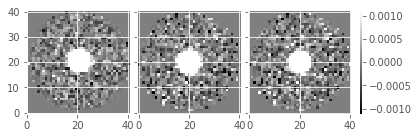

In [31]:
psf = template2.getPsf()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


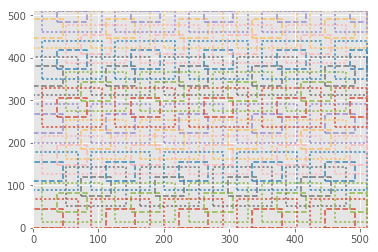

In [32]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
#config.borderSizeX = config.borderSizeY = 7
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2).exposure
task._plotBoxes(exposure2.getBBox())

stats(mean=0.96558559, stdev=17.685284, min=-74.0, max=4097.0)
stats(mean=0.021157876, stdev=24.289349, min=-376.32401, max=281.40808)
stats(mean=0.090663917, stdev=24.269018, min=-169.48924, max=266.89938)
stats(mean=1.2009642, stdev=24.59798, min=-122.97913, max=3990.082)
stats(mean=-0.0084884544264750145, stdev=1.1887588794969992, min=-1064.305429723697, max=504.02363907051961)
stats(mean=0.026632287204102163, stdev=26.849957710796861, min=-1102.7479702662686, max=599.04529974746708)
stats(mean=-0.012636132, stdev=26.691084, min=-401.68759, max=241.701)


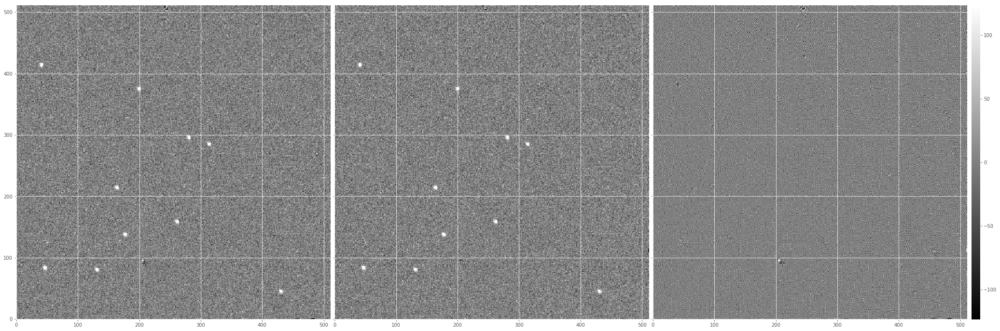

In [34]:
print dit.computeClippedImageStats(ga(exposure2))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExp2))
print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExp2) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
dit.plotImageGrid((ga(newExp2), ga(newExp), ga(newExp2) - ga(newExp)), #ga(newExp) - testObj.D_ZOGY.im), 
                  imScale=12)

Let's see what detection looks like on the new ZOGY diffim...

In [35]:
testObj2 = testObj.clone()
testObj2.D_ZOGY = dit.Exposure(ga(newExp2), testObj.D_Zogy.psf, newExp2.getMaskedImage().getVariance().getArray())
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 3, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 11, 'TP': 10}}

In [36]:
# for comparison, without using a spatially-varying PSF:
testObj.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 3, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 11, 'TP': 10}}

In [37]:
# let's add the one where I used the *input* but variable PSF
testObj3 = testObj.clone()
testObj3.D_ZOGY = dit.Exposure(ga(newExp), testObj.D_Zogy.psf, newExp.getMaskedImage().getVariance().getArray())
testObj3.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 3, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 11, 'TP': 10}}

In [38]:
# And the image-space version of that:
testObj2 = testObj.clone()
testObj2.D_ZOGY = dit.Exposure(ga(newExpB), testObj.D_Zogy.psf, newExpB.getMaskedImage().getVariance().getArray())
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 3, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 11, 'TP': 10}}

Try deblending and then re-measuring PSF on that catalog...

In [ ]:
exposure2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

In [ ]:
import lsst.meas.deblender as measDeblend
import lsst.afw.table as afwTable
import lsst.afw.math as afwMath
import lsst.afw.detection as afwDetection
from lsst.meas.base import SingleFrameMeasurementTask

config = SingleFrameMeasurementTask.ConfigClass()
config.slots.apFlux = 'base_CircularApertureFlux_12_0'
schema = afwTable.SourceTable.makeMinimalSchema()

measureSources = SingleFrameMeasurementTask(schema, config=config)

width, height = exposure2.getDimensions()
bbox = afwGeom.BoxI(afwGeom.PointI(0, 0), afwGeom.ExtentI(width, height))
cellSet = afwMath.SpatialCellSet(bbox, 100)

mi = exposure2.getMaskedImage()
footprintSet = afwDetection.FootprintSet(mi, afwDetection.Threshold(100), "DETECTED")

catalog = afwTable.SourceCatalog(schema)

footprintSet.makeSources(catalog)
print(len(catalog))
#catalog = catalog.copy(deep=True)

measureSources.run(catalog, exposure2)

In [ ]:
import lsst.meas.algorithms as measAlg

for source in catalog:
    try:
        cand = measAlg.makePsfCandidate(source, exposure2)
        cellSet.insertCandidate(cand)

    except Exception as e:
        print(e)
        continue

In [ ]:
dbConfig = measDeblend.SourceDeblendTask.ConfigClass()
deblendSources = measDeblend.SourceDeblendTask(schema, config=dbConfig)
deblendSources.run(exposure2, catalog)

# filter the catalog and use the deblended heavy footprint of the 
# children only
# then use MakeCandidateTask but tell it to use the heavy footprint images of those 
# deblended children

In [ ]:
starSelectorClass = measAlg.starSelectorRegistry["objectSize"]
starSelectorConfig = starSelectorClass.ConfigClass()
starSelectorConfig.sourceFluxField = "base_GaussianFlux_flux"
starSelectorConfig.badFlags = ["base_PixelFlags_flag_edge",
                               "base_PixelFlags_flag_interpolatedCenter",
                               "base_PixelFlags_flag_saturatedCenter",
                               "base_PixelFlags_flag_crCenter",
                               ]
starSelectorConfig.widthStdAllowed = 0.5  # Set to match when the tolerance of the test was set

starSelector = starSelectorClass(schema=schema, config=starSelectorConfig)

psfDeterminerClass = measAlg.psfDeterminerRegistry["psfex"]
psfDeterminerConfig = psfDeterminerClass.ConfigClass()
width, height = exposure.getMaskedImage().getDimensions()
psfDeterminerConfig.sizeCellX = width//8
psfDeterminerConfig.sizeCellY = height//8
psfDeterminerConfig.spatialOrder = 1

psfDeterminer = psfDeterminerClass(psfDeterminerConfig)

In [ ]:
import lsst.daf.base as dafBase

metadata = dafBase.PropertyList()
catalog = catalog.copy(deep=True)
psfCandidateList = starSelector.run(exposure2, catalog).psfCandidates
psf, cellSet = psfDeterminer.determinePsf(exposure2, psfCandidateList, metadata)

In [ ]:
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))), clim=(-0.001,0.001))

For comparison:

In [ ]:
psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))), clim=(-0.001,0.001))

In [ ]:
mi = exposure.getMaskedImage()
img = mi.getImage()

print type(exposure)
print type(mi)
print type(img)

In [ ]:
def _isExposureOrMaskedImageOrImage(item):
    if (isinstance(item, afwImage.ExposureU) or isinstance(item, afwImage.ExposureI) or
          isinstance(item, afwImage.ExposureF) or isinstance(item, afwImage.ExposureD)):
        return 'exposure'
    elif (isinstance(item, afwImage.MaskedImageU) or isinstance(item, afwImage.MaskedImageI) or
          isinstance(item, afwImage.MaskedImageF) or isinstance(item, afwImage.MaskedImageD)):
        return 'maskedImage'
    elif (isinstance(item, afwImage.ImageU) or isinstance(item, afwImage.ImageI) or
          isinstance(item, afwImage.ImageF) or isinstance(item, afwImage.ImageD)):
        return 'image'
    return 'none'

In [ ]:
print _isExposureOrMaskedImageOrImage(exposure)
print _isExposureOrMaskedImageOrImage(mi)
print _isExposureOrMaskedImageOrImage(img)